<h1 style="text-align: center;">Correction et Colorisation d'images</h1>

In [1]:
!pip install pycocotools opencv-python pillow tqdm


[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: pip install --upgrade pip


In [52]:
# Importation des différentes librairies utiles pour le notebook

# Sickit-learn met régulièrement à jour des versions et
# indique des futurs warnings. Ces lignes permettent de ne pas les afficher.
import warnings  # Permet de gérer les avertissements
warnings.filterwarnings("ignore", category=FutureWarning)

# Librairies générales
import pandas as pd  # Manipulation de données en format tabulaire
from scipy.stats import randint  # Pour les distributions aléatoires
import numpy as np  # Calcul numérique
from numpy import mean, std  # Statistiques de base
import os  # Interaction avec le système d'exploitation
from os import listdir  # Liste les fichiers dans un répertoire
from os.path import isfile, join  # Fonctions pour gérer les chemins de fichiers
import sys  # Manipulation du système
import random  # Génération de nombres aléatoires
import cv2  # Librairie pour la vision par ordinateur
import zipfile  # Manipulation des archives ZIP
import requests
from tqdm import tqdm
from pycocotools.coco import COCO
from PIL import Image

# Librairie d'affichage
import matplotlib.pyplot as plt  # Visualisation de données
from PIL import Image, ImageDraw, ImageFilter  # Manipulation d'images avec Pillow

# Scikit-learn pour l'apprentissage automatique
from sklearn.decomposition import PCA  # Analyse en composantes principales(ACP)

# TensorFlow et Keras pour le deep learning
import tensorflow as tf  # Framework principal pour l'apprentissage profond
import keras  # API de haut niveau pour TensorFlow
from keras import layers  # Modules de construction de modèles Keras
from keras import models  # Définition et manipulation des modèles
from keras import optimizers  # Optimisateurs pour les modèles Keras
from keras.optimizers import Adam  # Optimiseur Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator  #Générateur

# Utilitaires Keras pour le traitement d'images
from keras.utils import img_to_array, load_img  # Conversion images en tableaux
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau  # Gestion des checkpoints
from keras import backend as K  # Backend Keras pour opérations de bas niveau
from keras.models import Model, load_model  # Définition/chargement des modèles
from keras.layers import LeakyReLU  # Activation LeakyReLU
from keras.preprocessing import image  # Prétraitement des images

# Couches Keras pour les modèles convolutifs et autres
from keras.layers import (Input, Conv2D, Flatten, Dense, Conv2DTranspose,
                          Reshape, Activation,
                          BatchNormalization,
                          Dropout, Concatenate)  # Couches pour CNN et autoencoders
from keras.layers import (InputLayer, MaxPooling2D,
                          UpSampling2D)  # Couches supplémentaires pour les CNN



# Récuperer des images à partir de cocodataset

In [3]:
ann_url = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"

if not os.path.exists("annotations"):
    !wget -q {ann_url} -O annotations.zip
    with zipfile.ZipFile("annotations.zip", 'r') as zip_ref:
        zip_ref.extractall(".")

In [4]:
categories = ["dog", "cat", "elephant"]
coco = COCO("annotations/instances_train2017.json")

cat_ids = coco.getCatIds(catNms=categories)

img_ids = set()

for cat_id in cat_ids:
    ids = coco.getImgIds(catIds=[cat_id])
    img_ids.update(ids)

img_ids = list(img_ids)

print("Images trouvées :", len(img_ids))

loading annotations into memory...
Done (t=7.67s)
creating index...
index created!
Images trouvées : 10423


In [5]:
def valid_bbox(bbox, min_size=64):
    x, y, w, h = bbox
    return w > min_size and h > min_size and (w/h < 2 and h/w < 2)

In [6]:
output_dir = "COCO_animals/train"
os.makedirs(output_dir, exist_ok=True)

def process_image(img_info, coco, size=(128,128)):
    url = img_info["coco_url"]
    img_id = img_info["id"]

    try:
        img_data = requests.get(url, timeout=10).content
        img_array = np.frombuffer(img_data, np.uint8)
        img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)

        if img is None:
            return

        ann_ids = coco.getAnnIds(imgIds=img_id)
        anns = coco.loadAnns(ann_ids)

        for ann in anns:
            if not valid_bbox(ann["bbox"]):
                continue

            x, y, w, h = map(int, ann["bbox"])
            crop = img[y:y+h, x:x+w]

            if crop.size == 0:
                continue

            crop = cv2.resize(crop, size)
            crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

            filename = f"{img_id}.png"
            Image.fromarray(crop).save(os.path.join(output_dir, filename))
            break 

    except:
        pass

In [7]:
import shutil

output_dir = "COCO_animals/train"

if os.path.exists(output_dir):
    shutil.rmtree(output_dir)

os.makedirs(output_dir, exist_ok=True)

max_images = 4000

for img_id in tqdm(img_ids[:max_images]):
    img_info = coco.loadImgs(img_id)[0]
    process_image(img_info, coco)

100%|███████████████████████████████████████| 4000/4000 [50:13<00:00,  1.33it/s]


Nombre d'images : 3721
Shape : (128, 128, 3)


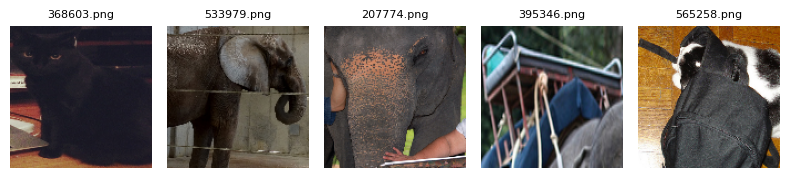

In [35]:
src_dir = "COCO_animals"
image_dir = "COCO_animals/train"
files = [f for f in os.listdir(image_dir) if f.endswith(".png")]

print("Nombre d'images :", len(files))

img = Image.open(os.path.join(image_dir, files[0]))
print("Shape :", img.size[::-1] + (3,))

random_files = random.sample(files, 5)

plt.figure(figsize=(8, 2))
for i, fname in enumerate(random_files):
    img_path = os.path.join(image_dir, fname)
    img = Image.open(img_path)

    plt.subplot(1, 5, i + 1)
    plt.imshow(img)
    plt.title(fname, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [36]:
data_flow = ImageDataGenerator(rescale=1./255).flow_from_directory(
    directory="COCO_animals",
    classes=['train'],
    target_size=(128,128),
    batch_size=512,
    shuffle=True,
    class_mode='input'
)

Found 3721 images belonging to 1 classes.


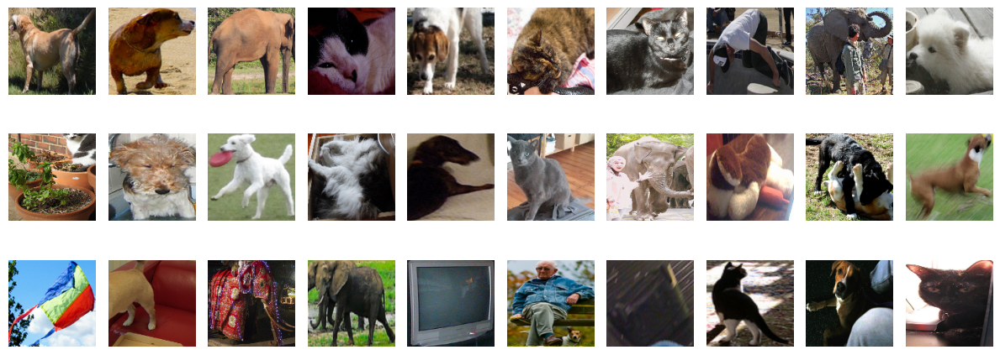

In [37]:
data_batch = next(data_flow)

images = data_batch[0]  # (batch_size, 128, 128, 3)

# combien d'images afficher
n = 30  

plt.figure(figsize=(12, 5))
for i in range(n):
    plt.subplot(3, 10, i + 1)
    plt.imshow(images[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

# Récuperer des modèles entraînés au préalable. 

In [38]:
# Définition du répertoire cible
model_dir = "./aeplus_models/"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)

zip_file = "aeplus_models.zip"

!wget https://www.lirmm.fr/~poncelet/Ressources/aeplus_models.zip


# Extraction du fichier ZIP
with zipfile.ZipFile(zip_file, "r") as zip_ref:
        zip_ref.extractall(model_dir)

# Suppression du fichier ZIP après extraction pour économiser de l'espace
os.remove(zip_file)

--2026-05-22 13:43:28--  https://www.lirmm.fr/~poncelet/Ressources/aeplus_models.zip
Résolution de www.lirmm.fr (www.lirmm.fr)… 193.49.104.251
Connexion à www.lirmm.fr (www.lirmm.fr)|193.49.104.251|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 107830545 (103M) [application/zip]
Enregistre : ‘aeplus_models.zip’

aeplus_models.zip   100%[===================>] 102,83M  5,80MB/s    ds 19s     

2026-05-22 13:43:47 (5,49 MB/s) - ‘aeplus_models.zip’ enregistré [107830545/107830545]



# Autoencodeur

In [39]:
image_size = (128, 128, 3)  # Dimensions des images (hauteur, largeur, canaux)
batch_size = 32             # Taille des lots
latent_dim = 200             # Dimension du vecteur latent pour l'autoencodeur
epochs = 150

In [40]:
def build_encoder(input_dim, output_dim):
    tf.keras.backend.clear_session()

    encoder_input = Input(shape=input_dim, name='encoder_input')
    x = encoder_input

    x = Conv2D(32, kernel_size=3, strides=2, padding='same',
               name='encoder_conv_1')(x)
    x = LeakyReLU(name='encoder_act_1')(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding='same',
               name='encoder_conv_2')(x)
    x = LeakyReLU(name='encoder_act_2')(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding='same',
               name='encoder_conv_3')(x)
    x = LeakyReLU(name='encoder_act_3')(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding='same',
               name='encoder_conv_4')(x)
    x = LeakyReLU(name='encoder_act_4')(x)

    shape_before_flattening = tf.keras.backend.int_shape(x)[1:]
    x = Flatten()(x)
    encoder_output = Dense(output_dim, name='encoder_output')(x)

    encoder = Model(encoder_input, encoder_output, name='encoder')
    return encoder_input, encoder_output, shape_before_flattening, encoder

In [41]:
# Création de l'encodeur avec les dimensions d'entrée et de sortie spécifiées
encoder_input, encoder_output, shape_before_flattening, encoder = build_encoder(
    input_dim=image_size,
    output_dim=latent_dim
)

# Affichage du résumé de l'encodeur
encoder.summary()

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_1 (Conv2D)         │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_act_1 (LeakyReLU)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_2 (Conv2D)         │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_act_2 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_3 (Conv2D)         │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_act_3 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_4 (Conv2D)         │ (None, 8, 8, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_act_4 (LeakyReLU)       │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_output (Dense)          │ (None, 200)            │       819,400 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 912,648 (3.48 MB)

 Trainable params: 912,648 (3.48 MB)

 Non-trainable params: 0 (0.00 B)

In [42]:
def build_decoder(input_dim, shape_before_flattening):
    # Entrée du décodeur (vecteur latent)
    decoder_input = Input(shape=(input_dim,), name='decoder_input')

    # Projeter dans un tenseur de même forme qu'avant le Flatten de l'encodeur
    x = Dense(np.prod(shape_before_flattening))(decoder_input)
    x = Reshape(shape_before_flattening)(x)

    # Couches de déconvolution (effet miroir de l'encodeur)
    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same',
                        name='decoder_conv_1')(x)
    x = LeakyReLU(name='decoder_act_1')(x)

    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same',
                        name='decoder_conv_2')(x)
    x = LeakyReLU(name='decoder_act_2')(x)

    x = Conv2DTranspose(32, kernel_size=3, strides=2, padding='same',
                        name='decoder_conv_3')(x)
    x = LeakyReLU(name='decoder_act_3')(x)

    x = Conv2DTranspose(3, kernel_size=3, strides=2, padding='same',
                        name='decoder_conv_4')(x)
    decoder_output = Activation('sigmoid', name='decoder_output')(x)

    decoder = Model(decoder_input, decoder_output, name='decoder')
    return decoder_input, decoder_output, decoder

In [43]:
# Création du décodeur en utilisant la dimension de l'espace latent
# et le shape  avant le flattening
decoder_input, decoder_output, decoder = build_decoder(
    input_dim=latent_dim,
    shape_before_flattening=shape_before_flattening
)

decoder.summary()

Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ decoder_input (InputLayer)      │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │       823,296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_1                  │ (None, 16, 16, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_act_1 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_2                  │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_act_2 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_3                  │ (None, 64, 64, 32)     │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_act_3 (LeakyReLU)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_4                  │ (None, 128, 128, 3)    │           867 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_output (Activation)     │ (None, 128, 128, 3)    │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 916,483 (3.50 MB)

 Trainable params: 916,483 (3.50 MB)

 Non-trainable params: 0 (0.00 B)

In [44]:
# L'entrée du modèle autoencodeur est celle de l'encodeur
autoencoder_input = encoder_input

# La sortie est obtenue en appliquant le décodeur à la sortie de l'encodeur
autoencoder_output = decoder(encoder_output)

# Création du modèle autoencodeur complet (encodeur + décodeur)
autoencoder = Model(autoencoder_input, autoencoder_output, name='autoencoder')

# Affichage de la structure du modèle
autoencoder.summary()

Model: "autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_1 (Conv2D)         │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_act_1 (LeakyReLU)       │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_2 (Conv2D)         │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_act_2 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_3 (Conv2D)         │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_act_3 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_conv_4 (Conv2D)         │ (None, 8, 8, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_act_4 (LeakyReLU)       │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder_output (Dense)          │ (None, 200)            │       819,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder (Functional)            │ (None, 128, 128, 3)    │       916,483 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,829,131 (6.98 MB)

 Trainable params: 1,829,131 (6.98 MB)

 Non-trainable params: 0 (0.00 B)

In [45]:
def train_autoencoder_from_generator(model, train_gen, val_gen,
                                     model_path, epochs=100, patience=5):
    """
    Entraîne un autoencodeur avec des générateurs Keras.

    Args:
        model         : modèle Keras compilé
        train_gen     : générateur d'entraînement
        val_gen       : générateur de validation
        model_path    : chemin de sauvegarde du meilleur modèle
        epochs        : nombre maximal d’époques
        patience      : patience pour EarlyStopping

    Returns:
        Le modèle avec les meilleurs poids restaurés.
    """
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=patience,
                      restore_best_weights=True, verbose=1),
        ModelCheckpoint(filepath=model_path,
                        monitor='val_loss',
                        save_best_only=True,
                        save_weights_only=False,
                        verbose=1)
    ]

    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )

    return model

In [46]:
# Définition des hyperparamètres
model_name = "coco_ae_best.keras"
model_path = os.path.join(model_dir, model_name)

# Compilation du modèle autoencodeur
autoencoder.compile(
    optimizer='adam',
    loss='binary_crossentropy'
)

# Générateur principal avec normalisation  et séparation train/validation
train_gen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Générateur pour les données d'entraînement
train_flow = train_gen.flow_from_directory(
    directory=src_dir,
    classes=['train'],  # le sous-dossier contenant toutes les images
    target_size=image_size[:2],
    batch_size=batch_size,
    shuffle=True,
    seed=42,
    class_mode='input',
    subset='training'
)

# Générateur pour les données de validation
val_flow = train_gen.flow_from_directory(
    directory=src_dir,
    classes=['train'],
    target_size=image_size[:2],
    batch_size=batch_size,
    shuffle=False,
    seed=42,
    class_mode='input',
    subset='validation'
)


# Entraînement du modèle autoencodeur
autoencoder = train_autoencoder_from_generator(
    model=autoencoder,
    train_gen=train_flow,
    val_gen=val_flow,
    model_path=model_path,
    epochs=epochs,
    patience=5
)

Found 2977 images belonging to 1 classes.
Found 744 images belonging to 1 classes.
Epoch 1/150
 1/94 ━━━━━━━━━━━━━━━━━━━━ 1:52 1s/step - loss: 0.6931

E0000 00:00:1779450244.090626   31708 meta_optimizer.cc:966] remapper failed: INVALID_ARGUMENT: Mutation::Apply error: fanout 'StatefulPartitionedCall/gradient_tape/autoencoder_1/encoder_act_2_1/LeakyRelu/LeakyReluGrad' exist for missing node 'StatefulPartitionedCall/autoencoder_1/encoder_conv_2_1/BiasAdd'.


94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.6718
Epoch 1: val_loss improved from None to 0.58843, saving model to ./aeplus_models/coco_ae_best.keras
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - loss: 0.6430 - val_loss: 0.5884
Epoch 2/150
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.5784
Epoch 2: val_loss improved from 0.58843 to 0.56079, saving model to ./aeplus_models/coco_ae_best.keras
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.5714 - val_loss: 0.5608
Epoch 3/150
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.5591
Epoch 3: val_loss improved from 0.56079 to 0.55273, saving model to ./aeplus_models/coco_ae_best.keras
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - loss: 0.5586 - val_loss: 0.5527
Epoch 4/150
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.5513
Epoch 4: val_loss improved from 0.55273 to 0.55035, saving model to ./aeplus_models/coco_ae_best.keras
94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.5519 - val_loss: 0.5503
Epoch 5/150
94/94 ━━━━━━━━━━━━━━━━━━━━ 

In [47]:
def show_images(autoencoder, images=None):
    """
    Fonction pour afficher les images originales et leurs reconstructions générées par l'autoencodeur.

    Si aucun lot d'images n'est fourni, la fonction récupère un lot d'images depuis le générateur de données.

    Arguments :
    - autoencoder : L'autoencodeur entraîné, utilisé pour générer des reconstructions des images.
    - images (optionnel) : Un tableau d'images à afficher. Si non spécifié, un lot d'images est récupéré du générateur de données.

    Sortie :
    - Affichage des images originales et leurs reconstructions générées par l'autoencodeur.
    """

    if images is None:
        example_batch = next(data_flow)
        example_batch = example_batch[0]
        images = example_batch[:10]

    n_to_show = images.shape[0]

    # Génération des reconstructions des images
    reconst_images = autoencoder.predict(images)

    # Création de la figure pour l'affichage
    fig = plt.figure(figsize=(15, 3))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)

    # Affichage des images originales
    for i in range(n_to_show):
        img = images[i].squeeze()
        sub = fig.add_subplot(2, n_to_show, i+1)
        sub.axis('off')
        sub.imshow(img)

    # Affichage des images reconstruites
    for i in range(n_to_show):
        img = reconst_images[i].squeeze()
        sub = fig.add_subplot(2, n_to_show, i+n_to_show+1)
        sub.axis('off')
        sub.imshow(img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


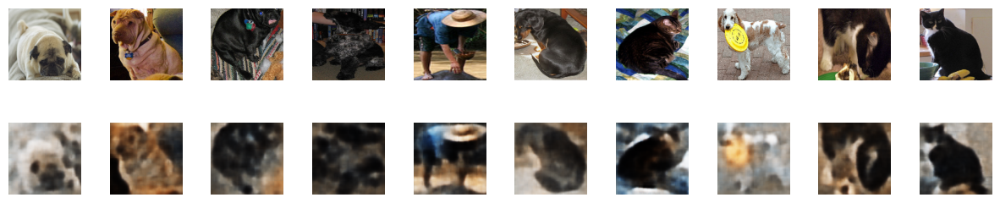

In [48]:
# Chemin vers le modèle entraîné
model_path = os.path.join(model_dir, "coco_ae_best.keras")

# Chargement du modèle
autoencoder = load_model(model_path)

# Récupère le premier lot d'images du générateur de données
example_batch = next(data_flow)

# Sélectionne uniquement les images du batch (le premier élément a les images)
example_batch = example_batch[0]

# Prend les 10 premières images du lot pour les afficher
example_images = example_batch[:10]

# Affiche les images originales et reconstruites par l'autoencodeur
show_images(autoencoder, example_images)

## Utilisation des autoencodeurs pour correction et coloration des images

on va d'abord définir la fonction pour bruiter l'image, la mettre en noir et blan et ajouter un masque sur cette dernière

In [49]:
def addMask(image: Image.Image) -> np.array :
    """ Ajoute un masque noir de taille aléatoire à une position aléatoire"""
    size = random.randint(30,60)
    start = random.randint(0,128-size)
    out = image.copy()
    ImageDraw.Draw(out).rectangle(
        [(start, start), (start + size, start + size)], fill='black'
    )
    return np.array(out)
    
def addNoise(image: Image.Image, level: float = 4.0) -> Image.Image:
    """Ajoute du bruit gaussien, l'intensité est varié d'une image à l'autre"""
    scale = 25 * level * random.uniform(0.8, 1.2)
    arr = np.array(image, dtype=np.float32)
    noisy = arr + np.random.normal(0, scale, arr.shape)
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    return Image.fromarray(noisy)

def rgbToGreyScale(image: Image.Image) -> np.ndarray:
    """Convertit l'image rgb au niveau de gris"""
    gray = image.convert("L").resize((128, 128))
    arr = np.array(gray)
    return np.stack([arr] * 3, axis=-1)

def addBlur(image: Image.Image, radius: float = None) -> np.ndarray:
    """Applique un flou gaussien """
    if radius is None:
        radius = random.uniform(2.0, 5.0)
    blurred = image.filter(ImageFilter.GaussianBlur(radius=radius))
    return np.array(blurred)

def combined_filters(image: Image.Image) -> np.ndarray:
    """Applique aléatoirement une combinaison de corruptions """
    img = image.copy()
    if random.random() < 0.5:
        img = addNoise(img, level=2.0)        
    if random.random() < 0.5:
        img = Image.fromarray(addMask(img))
    if random.random() < 0.3:
        img = Image.fromarray(addBlur(img))   
    return np.array(img)


#autres filtres à tester si ça marche avec les autres fonctions :

def add_scratch(image: Image.Image) -> np.ndarray:
    """Ajoute des rayures aléatoires (comme sur une vieille pellicule)"""
    img = np.array(image)
    num_scratch = random.randint(1, 5)
    for _ in range(num_scratch):
        y_start = random.randint(0, img.shape[0])
        x_start = random.randint(0, img.shape[1])
        length = random.randint(20, 100)
        thickness = random.randint(1, 3)
        angle = random.uniform(0, 2 * np.pi)
        x_end = int(x_start + length * np.cos(angle))
        y_end = int(y_start + length * np.sin(angle))
        cv2.line(img, (x_start, y_start), (x_end, y_end), 
                 (255, 255, 255) if random.random() > 0.5 else (0, 0, 0), thickness)
    return img

def add_dust_and_scratches(image: Image.Image) -> np.ndarray:
    """Ajoute de la poussière (petits points blancs/noirs)"""
    img = np.array(image)
    mask = np.random.random(img.shape[:2]) < 0.005  # 0.5% de pixels
    dust_color = np.random.choice([0, 255], size=mask.sum())
    img[mask] = dust_color[:, np.newaxis]
    return img

def add_jpeg_artifacts(image: Image.Image, quality: int = None) -> np.ndarray:
    """Simule une compression JPEG agressive"""
    if quality is None:
        quality = random.randint(10, 60)
    _, encoded = cv2.imencode('.jpg', cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR), 
                               [cv2.IMWRITE_JPEG_QUALITY, quality])
    decoded = cv2.imdecode(encoded, cv2.IMREAD_COLOR)
    return cv2.cvtColor(decoded, cv2.COLOR_BGR2RGB)

def add_pixelation(image: Image.Image, block_size: int = None) -> np.ndarray:
    """Effet pixelisé (comme une basse résolution)"""
    if block_size is None:
        block_size = random.randint(4, 16)
    h, w = image.size
    small = image.resize((w // block_size, h // block_size), Image.NEAREST)
    return np.array(small.resize((w, h), Image.NEAREST))

def add_glitch_effect(image: Image.Image) -> np.ndarray:
    """Effet 'glitch' numérique (décalage de bandes)"""
    img = np.array(image)
    h, w = img.shape[:2]
    num_glitches = random.randint(3, 10)
    
    for _ in range(num_glitches):
        y_start = random.randint(0, h - 20)
        y_end = y_start + random.randint(5, 30)
        shift = random.randint(-30, 30)
        
        # Décale une bande horizontale
        glitch_band = img[y_start:y_end, :].copy()
        if shift > 0:
            glitch_band = np.roll(glitch_band, shift, axis=1)
            if shift > 0:
                glitch_band[:, :shift] = 0
        else:
            glitch_band = np.roll(glitch_band, shift, axis=1)
            if shift < 0:
                glitch_band[:, shift:] = 0
        img[y_start:y_end, :] = glitch_band
    
    return img

#dictionnaire
corruption_funcs = {
    'mask' : lambda img: addMask(img),
    'noise' : lambda img: np.array(addNoise(img)),
    'blur' : lambda img: addBlur(img),
    'blackwhite' : lambda img: rgbToGreyScale(img),
    'combined' : lambda img: combined_filters(img),
}

In [50]:
def myImageGenerator( folder :str, target_size:tuple, batch_size:int, typeimage: str = 'mask', shuffle: bool=True):
    " Génère des paires infinie d'images corrompus et les images origines "
    corrupt_func = corruption_funcs[typeimage]
    files = [join(folder, f) for f in os.listdir(folder) if f.endswith(".png")]

    idx = 0 
    while True :
        if ((idx + batch_size) > len(files) ):
            if shuffle:
                random.shuffle(files)
            idx = 0
        batch_paths = files[idx : idx+batch_size]
        originals, corrupted = [], []
        for path in batch_paths :
            img = Image.open(path).convert("RGB").resize(target_size, Image.BILINEAR)
            originals.append(np.array(img) / 255.0)
            corrupted.append(corrupt_func(img) / 255.0)
        
        idx += batch_size
        yield np.array(corrupted, dtype=np.float32), np.array(originals, dtype=np.float32)

In [24]:
#paramètres globaux

IMAGE_SIZE = (128, 128, 3) 
TARGET_SIZE = (128, 128)  
BATCH_SIZE = 32
LATENT_DIM = 300  
EPOCHS = 150 
PATIENCE = 8

src_dir= "COCO_animals"
image_dir = "COCO_animals/train"
model_name = "coco_ae_best.keras"
model_path = os.path.join(model_dir, model_name)

mask  : =============================================================================================================


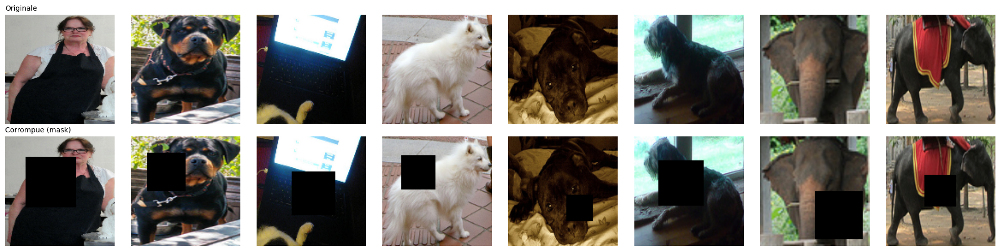

noise  : =============================================================================================================


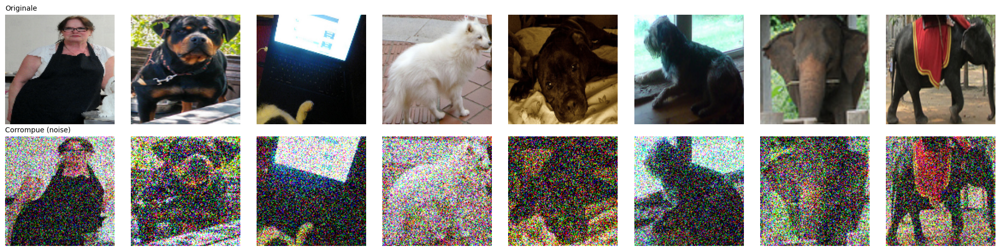

blackwhite  : =============================================================================================================


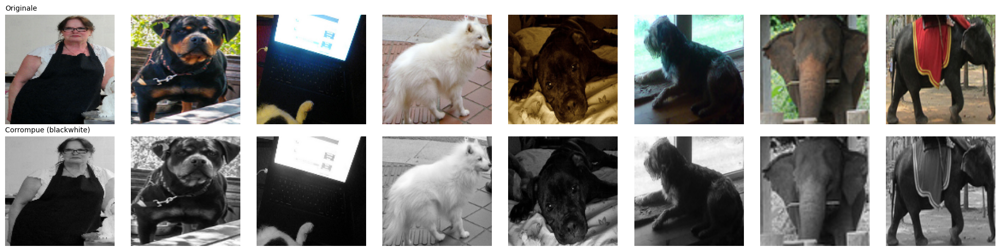

blur  : =============================================================================================================


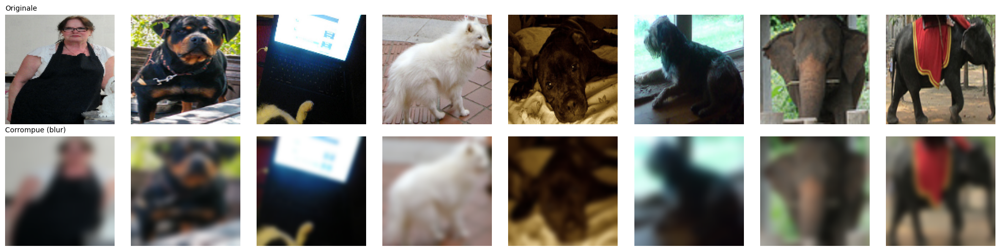

combined  : =============================================================================================================


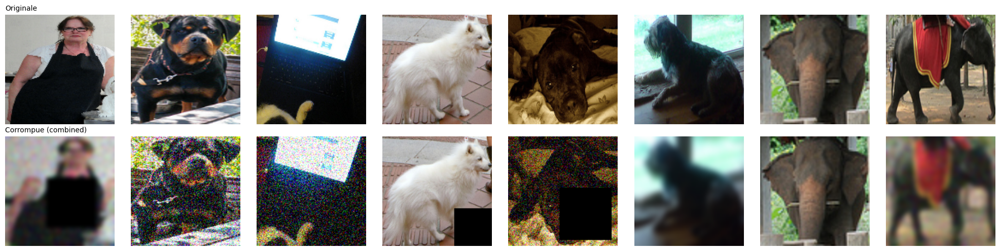

In [25]:
#visualisation 

def display_batch(batch, typeimage: str, n: int = 8):
    corrupted, originals = batch[0][:n], batch[1][:n]
    
    fig, axes = plt.subplots(2, n, figsize=(2.5 * n, 5))
    titles    = ["Originale", f"Corrompue ({typeimage})"]
    
    for row, (imgs, title) in enumerate(zip([originals, corrupted], titles)):
        for col in range(n):
            ax = axes[row, col]
            cmap = 'gray' if typeimage == 'blackwhite' and row == 1 else None
            ax.imshow(np.clip(imgs[col], 0, 1), cmap=cmap)
            ax.axis('off')
            if col == 0:
                ax.set_title(title, fontsize=10, loc='left')
    plt.tight_layout()
    plt.show()


# Prévisualisation des différents types de corruption
for t in ['mask', 'noise', 'blackwhite', 'blur', 'combined']:
    print(t, " : =============================================================================================================")
    gen   = myImageGenerator(image_dir, TARGET_SIZE, batch_size=8, typeimage=t)
    batch = next(gen)
    display_batch(batch, t)

me curious about using different loss functions sooo :p

In [26]:
def ssim_loss(y_true, y_pred, max_val=1.0):
    return 1.0 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val))

def ms_ssim_loss(y_true, y_pred, max_val=1.0):
    return 1.0 - tf.reduce_mean(tf.image.ssim_multiscale(y_true, y_pred, max_val))

def l1_loss(y_true, y_pred):
    return tf.reduce_mean(tf.abs(y_true - y_pred))

def l2_loss(y_true, y_pred):
    return tf.reduce_mean(tf.square(y_true - y_pred))

def mix_loss(alpha=0.84):
    """
    Mix Loss = α * MS-SSIM + (1-α) * L1
    α = 0.84 selon l'article 
    
    MS-SSIM préserve les structures et contrastes
    L1 maintient les couleurs vives et évite les shifts
    """
    def loss(y_true, y_pred):
        # MS-SSIM peut être instable en début d'entraînement
        # On ajoute un epsilon pour la stabilité
        ms_ssim_val = tf.image.ssim_multiscale(y_true, y_pred, max_val=1.0)
        ms_ssim_val = tf.clip_by_value(ms_ssim_val, 0.0, 1.0)
        
        l1_val = l1_loss(y_true, y_pred)
        
        return alpha * (1.0 - ms_ssim_val) + (1.0 - alpha) * l1_val
    
    loss.__name__ = f'mix_loss'
    return loss

def mix_loss_with_l2(alpha=0.84, beta=0.1):
    """
    Variante avec L2 pour les cas où L1 est trop agressif
    Loss = α*(1-MS-SSIM) + β*L1 + (1-α-β)*L2
    """
    def loss(y_true, y_pred):
        ms_ssim_val = tf.image.ssim_multiscale(y_true, y_pred, max_val=1.0)
        ms_ssim_val = tf.clip_by_value(ms_ssim_val, 0.0, 1.0)
        
        return (alpha * (1.0 - ms_ssim_val) + 
                beta * l1_loss(y_true, y_pred) + 
                (1.0 - alpha - beta) * l2_loss(y_true, y_pred))
    
    loss.__name__ = f'mix_l2_loss_alpha_{alpha}_beta_{beta}'
    return loss

def perceptual_mix_loss(alpha=0.84, use_ms_ssim=True):
    """
    Version avancée : Mix loss mais en s'assurant que MS-SSIM capture bien
    les hautes fréquences
    """
    def loss(y_true, y_pred):
        if use_ms_ssim:
            # MS-SSIM pour la qualité structurelle multi-échelle
            ssim_val = tf.image.ssim_multiscale(y_true, y_pred, max_val=1.0)
        else:
            # SSIM simple (plus rapide)
            ssim_val = tf.image.ssim(y_true, y_pred, max_val=1.0)
        
        ssim_val = tf.clip_by_value(ssim_val, 0.0, 1.0)
        l1_val = tf.reduce_mean(tf.abs(y_true - y_pred))
        
        return alpha * (1.0 - ssim_val) + (1.0 - alpha) * l1_val
    
    return loss

In [27]:
#i highkey don't know how to test all of them :(
autoencoder.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss=l1_loss
)

print("Modèle compilé avec perte combinée MS-SSIM & L1.")

Modèle compilé avec perte combinée MS-SSIM & L1.


In [28]:
def train_autoencoder(model, image_dir, typeimage,
                      model_name, epochs=EPOCHS,
                      batch_size=BATCH_SIZE, patience=PATIENCE):
   
    n_images = len([f for f in os.listdir(image_dir) if f.endswith('.png')])
    steps_train = max(1, int(n_images * 0.8) // batch_size)
    steps_val = max(1, int(n_images * 0.2) // batch_size)
    
    train_gen = myImageGenerator(image_dir, TARGET_SIZE, batch_size, typeimage, shuffle=True)
    val_gen = myImageGenerator(image_dir, TARGET_SIZE, batch_size, typeimage, shuffle=False)
    
    model_path = join(model_dir, model_name)
    
    callbacks = [
        EarlyStopping(
            monitor='val_loss', patience=patience,
            restore_best_weights=True, verbose=1
        ),
        ModelCheckpoint(
            filepath=model_path, monitor='val_loss',
            save_best_only=True, verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss', factor=0.5,
            patience=3, min_lr=1e-6, verbose=1
        ),
    ]
    
    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=epochs,
        steps_per_epoch=steps_train,
        validation_steps=steps_val,
        callbacks=callbacks,
        verbose=1
    )
    
    plot_history(history, typeimage)
    return model, history


def plot_history(history, title: str = ""):
    """Affiche les courbes train/val loss pour détecter le sur-apprentissage."""
    plt.figure(figsize=(8, 4))
    plt.plot(history.history['loss'],     label='Entraînement', lw=2)
    plt.plot(history.history['val_loss'], label='Validation',   lw=2, linestyle='--')
    plt.xlabel('Époque')
    plt.ylabel('Perte')
    plt.title(f'Courbe d\'apprentissage — {title}')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

Epoch 1/20
 1/93 ━━━━━━━━━━━━━━━━━━━━ 3:03 2s/step - loss: 0.1225

E0000 00:00:1779416801.973573   31708 meta_optimizer.cc:966] remapper failed: INVALID_ARGUMENT: Mutation::Apply error: fanout 'StatefulPartitionedCall/gradient_tape/autoencoder_1/encoder_act_3_1/LeakyRelu/LeakyReluGrad' exist for missing node 'StatefulPartitionedCall/autoencoder_1/encoder_conv_3_1/BiasAdd'.


93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1091
Epoch 1: val_loss improved from None to 0.08916, saving model to ./aeplus_models/coco_ae_best.keras
93/93 ━━━━━━━━━━━━━━━━━━━━ 13s 120ms/step - loss: 0.0994 - val_loss: 0.0892 - learning_rate: 0.0010
Epoch 2/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0894
Epoch 2: val_loss improved from 0.08916 to 0.08336, saving model to ./aeplus_models/coco_ae_best.keras
93/93 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - loss: 0.0878 - val_loss: 0.0834 - learning_rate: 0.0010
Epoch 3/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0851
Epoch 3: val_loss did not improve from 0.08336
93/93 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - loss: 0.0840 - val_loss: 0.0836 - learning_rate: 0.0010
Epoch 4/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0827
Epoch 4: val_loss improved from 0.08336 to 0.07976, saving model to ./aeplus_models/coco_ae_best.keras
93/93 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - loss: 0.0823 - val_loss: 0.0798 - learning_rate

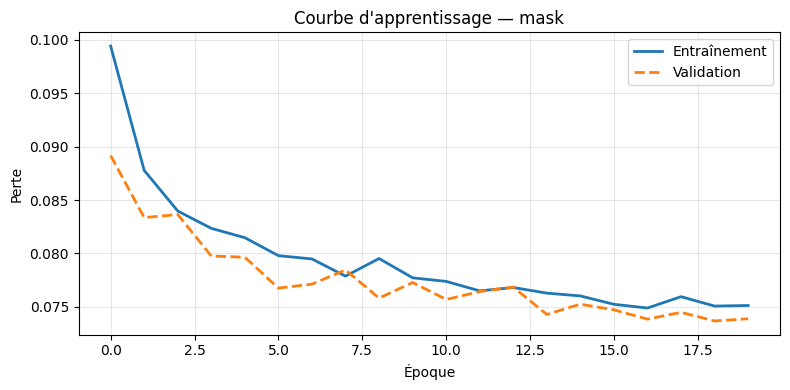

In [29]:
model, history = train_autoencoder(
    model=autoencoder,
    image_dir=image_dir,
    typeimage='mask',
    model_name=model_name,
    epochs=20
)

In [30]:
def show_reconstruction(model, generator, n=6):
    corrupted, originals = next(generator)

    corrupted = corrupted[:n]
    originals = originals[:n]
    reconstructed = model.predict(corrupted)

    fig, axes = plt.subplots(3, n, figsize=(3*n, 8))

    # Column titles (THIS is the key fix)
    titles = ["Corrupted", "Reconstructed", "Original"]

    for i in range(n):

        axes[0, i].imshow(corrupted[i])
        axes[0, i].axis("off")

        axes[1, i].imshow(reconstructed[i])
        axes[1, i].axis("off")

        axes[2, i].imshow(originals[i])
        axes[2, i].axis("off")

    # Add big row labels on the left
    axes[0,0].set_ylabel("Corrupted", fontsize=12)
    axes[1,0].set_ylabel("Reconstructed", fontsize=12)
    axes[2,0].set_ylabel("Original", fontsize=12)

    # Add column titles on top
    for i in range(n):
        axes[0, i].set_title(f"Sample {i+1}", fontsize=10)

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


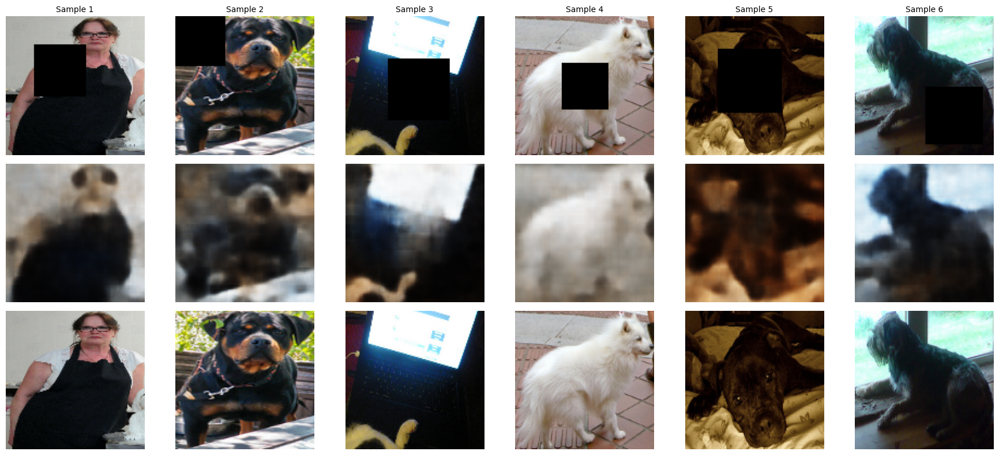

In [31]:
test_gen = myImageGenerator(
    image_dir,
    target_size=TARGET_SIZE,
    batch_size=8,
    typeimage='mask',
    shuffle=True
)

show_reconstruction(autoencoder, test_gen, n=6)

Epoch 1/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0792
Epoch 1: val_loss improved from None to 0.07598, saving model to ./aeplus_models/coco_ae_best.keras
93/93 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0792 - val_loss: 0.0760 - learning_rate: 0.0010
Epoch 2/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0784
Epoch 2: val_loss did not improve from 0.07598
93/93 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0781 - val_loss: 0.0763 - learning_rate: 0.0010
Epoch 3/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0773
Epoch 3: val_loss did not improve from 0.07598
93/93 ━━━━━━━━━━━━━━━━━━━━ 16s 169ms/step - loss: 0.0772 - val_loss: 0.0762 - learning_rate: 0.0010
Epoch 4/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0779
Epoch 4: val_loss improved from 0.07598 to 0.07449, saving model to ./aeplus_models/coco_ae_best.keras
93/93 ━━━━━━━━━━━━━━━━━━━━ 16s 174ms/step - loss: 0.0770 - val_loss: 0.0745 - learning_rate: 0.0010
Epoch 5/20
93/93 ━━━━━━━━━━━━━━━━━━

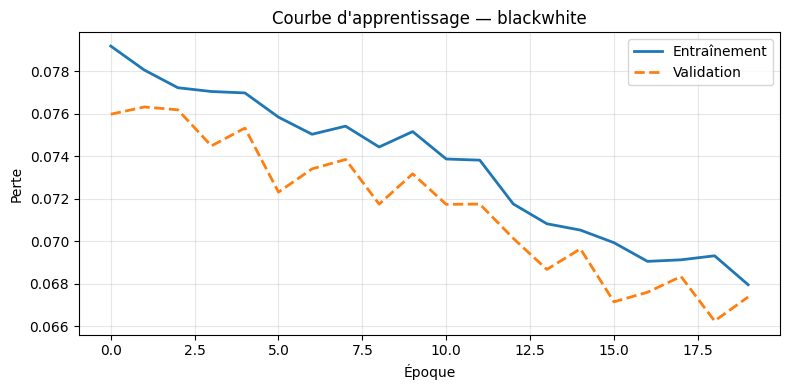

In [32]:
model, history = train_autoencoder(
    model=autoencoder,
    image_dir=image_dir,
    typeimage='blackwhite',
    model_name=model_name,
    epochs=20
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


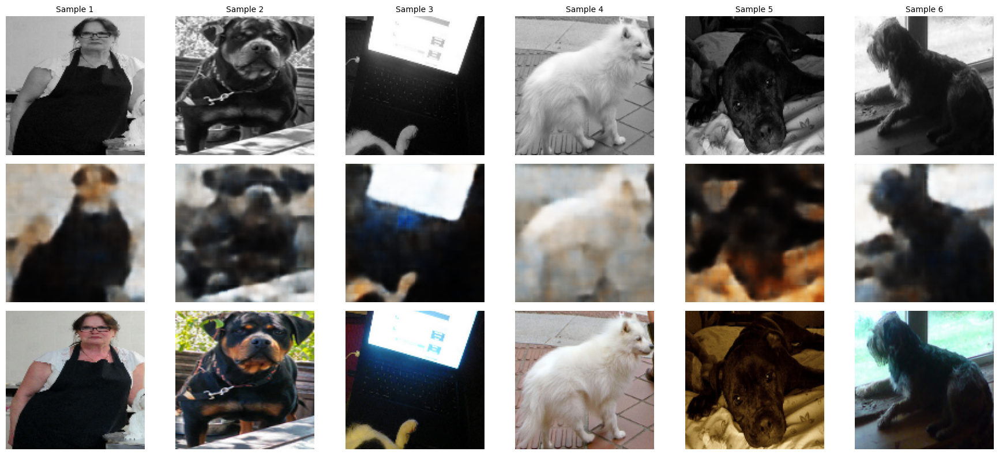

In [33]:
test_gen = myImageGenerator(
    image_dir,
    target_size=TARGET_SIZE,
    batch_size=8,
    typeimage='blackwhite',
    shuffle=True
)

show_reconstruction(autoencoder, test_gen, n=6)

In [34]:
#hmm results aren't that satisfactory but that is to be expected with using only l1 as it only compares images from pixel to pixel
#and i think it might be time to make the architecture of the autoencoder more complicated

On observe un rendu flou pour les images reconstruite, cela peut être expliqué par le fait que nos images de 128*128 
traverse 4 convolution et arrive à 8*8. Ces valeurs sont compréssées dans un vecteur de 300 dimensions
et le décodeur doit reconstruire 128*128*3 pixels à partir de 300 chiffre.

On essaira différents modèle 

## U-Nets

In [53]:
def build_unet_autoencoder(input_shape=(128, 128, 3), latent_dim=300):
    """
    add comment 
    """

    def conv_block(x, filters, name):
        """Bloc conv -> BN -> activation"""
        x = Conv2D(filters, 3, strides=2, padding='same', name=f'{name}_conv')(x)
        x = BatchNormalization(name=f'{name}_bn')(x)
        x = LeakyReLU(name=f'{name}_act')(x)
        return x

    def deconv_block(x, skip, filters, name):
        """
        Bloc décodeur avec skip connection.

        Paramètres :
        - x : sortie du bloc décodeur précédent
        - skip : feature map de l'encodeur au même niveau de résolution
        - filters : nombre de filtres

        Ordre des opérations :
        1. Conv2DTranspose(stride=2) --> upsampling 
        2. Concatenate([x_up, skip]) --> colle les features encodeur
        3. Conv2D(stride=1) -->  fusion des informations
        4. B
        N + activation
        """
        # Upsampling
        x = Conv2DTranspose(filters, 3, strides=2, padding='same',
                            name=f'{name}_deconv')(x)
        x = BatchNormalization(name=f'{name}_bn1')(x)
        x = LeakyReLU(name=f'{name}_act1')(x)

        # Concat
        x = Concatenate(name=f'{name}_skip')([x, skip])

        # Conv de fusion / change pas resolution spatiale
        x = Conv2D(filters, 3, padding='same', name=f'{name}_merge')(x)
        x = BatchNormalization(name=f'{name}_bn2')(x)
        x = LeakyReLU(name=f'{name}_act2')(x)
        return x

    # Encoder
    inputs = Input(shape=input_shape, name='input')

    e1 = conv_block(inputs, 32,  'enc1')  
    e2 = conv_block(e1,     64,  'enc2')  
    e3 = conv_block(e2,     128, 'enc3')   
    e4 = conv_block(e3,     256, 'enc4')   

    # Bottleneck 
    bottleneck = conv_block(e4, 256, 'bottleneck')  # 4×4×256

    # Decoder
    # each bloc gets the output of the previous bloc + skip 
    d4 = deconv_block(bottleneck, e4, 256, 'dec4')  # → 8×8
    d3 = deconv_block(d4,         e3, 128, 'dec3')  # → 16×16
    d2 = deconv_block(d3,         e2,  64, 'dec2')  # → 32×32
    d1 = deconv_block(d2,         e1,  32, 'dec1')  # → 64×64

    outputs = Conv2DTranspose(3, 3, strides=2, padding='same',
                              activation='sigmoid', name='output')(d1)

    model = Model(inputs, outputs, name='unet_autoencoder')
    return model


unet = build_unet_autoencoder()
unet.summary()

params_unet = unet.count_params()
print(f'\nU-Net Param: {params_unet:,}')
print('(we had 1 829 131 parameters)')

Model: "unet_autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 128, 128,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc1_conv (Conv2D)  │ (None, 64, 64,    │        896 │ input[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc1_bn             │ (None, 64, 64,    │        128 │ enc1_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc1_act            │ (None, 64, 64,    │          0 │ enc1_bn[0][0]     │
│ (LeakyReLU)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc2_conv (Conv2D)  │ (None, 32, 32,    │     18,496 │ enc1_act[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc2_bn             │ (None, 32, 32,    │        256 │ enc2_conv[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc2_act            │ (None, 32, 32,    │          0 │ enc2_bn[0][0]     │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc3_conv (Conv2D)  │ (None, 16, 16,    │     73,856 │ enc2_act[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc3_bn             │ (None, 16, 16,    │        512 │ enc3_conv[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc3_act            │ (None, 16, 16,    │          0 │ enc3_bn[0][0]     │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc4_conv (Conv2D)  │ (None, 8, 8, 256) │    295,168 │ enc3_act[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc4_bn             │ (None, 8, 8, 256) │      1,024 │ enc4_conv[0][0]   │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc4_act            │ (None, 8, 8, 256) │          0 │ enc4_bn[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bottleneck_conv     │ (None, 4, 4, 256) │    590,080 │ enc4_act[0][0]    │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bottleneck_bn       │ (None, 4, 4, 256) │      1,024 │ bottleneck_conv[… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bottleneck_act      │ (None, 4, 4, 256) │          0 │ bottleneck_bn[0]… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dec4_deconv         │ (None, 8, 8, 256) │    590,080 │ bottleneck_act[0… │
│ (Conv2DTranspose)   │                   │            │                 

 Total params: 3,530,723 (13.47 MB)

 Trainable params: 3,527,331 (13.46 MB)

 Non-trainable params: 3,392 (13.25 KB)


U-Net Param: 3,530,723
(we had 1 829 131 parameters)
